In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
file_path = "/content/drive/MyDrive/eeg_signals_raw_with_mean_std.pth"

file_data = torch.load(file_path)

In [3]:
print(type(file_data))

<class 'dict'>


In [4]:

print(file_data['dataset'][0]['eeg'])

tensor([[    0,     0,     2,  ...,   -37,   -39,   -38],
        [  -12,   -11,    -8,  ...,   -26,   -30,   -33],
        [   35,    29,    21,  ...,   -17,   -12,    -9],
        ...,
        [ -830,  -826,  -838,  ...,  -935,  -956, -1028],
        [ -782,  -848,  -840,  ...,  -951,  -987,  -994],
        [-2656, -2643, -2616,  ..., -2747, -2779, -2786]], dtype=torch.int16)


In [5]:
from scipy.signal import butter, sosfiltfilt
import torch
import numpy as np


In [6]:
print(type(file_data))             # Should be a dict
print(file_data.keys())          # Print the keys to see what's inside
print(type(file_data['dataset']))  # Should be a list
print(type(file_data['dataset'][0])) # What's the first element of the list?
print(file_data['dataset'][0])     # What does it look like?

<class 'dict'>
dict_keys(['dataset', 'labels', 'images', 'means', 'stddevs'])
<class 'list'>
<class 'dict'>
{'eeg': tensor([[    0,     0,     2,  ...,   -37,   -39,   -38],
        [  -12,   -11,    -8,  ...,   -26,   -30,   -33],
        [   35,    29,    21,  ...,   -17,   -12,    -9],
        ...,
        [ -830,  -826,  -838,  ...,  -935,  -956, -1028],
        [ -782,  -848,  -840,  ...,  -951,  -987,  -994],
        [-2656, -2643, -2616,  ..., -2747, -2779, -2786]], dtype=torch.int16), 'image': 0, 'label': 10, 'subject': 4}


In [7]:
def bandpass_filter(data, lowcut=1.0, highcut=40.0, fs=250.0, order=4):
    """
    Apply bandpass filter to 2D EEG tensor (channels x time).
    """
    sos = butter(order, [lowcut, highcut], btype='band', fs=fs, output='sos')
    # Apply filter to each channel
    filtered = np.zeros_like(data, dtype=np.float32)
    for i in range(data.shape[0]):
        filtered[i] = sosfiltfilt(sos, data[i])
    return filtered


In [8]:
filtered_dataset = []

for sample in file_data['dataset']:
    eeg_tensor = sample['eeg']                   # shape: (channels, time)
    eeg_np = eeg_tensor.numpy().astype(np.float32)

    filtered_eeg = bandpass_filter(eeg_np, lowcut=5, highcut=95, fs=250)

    new_sample = sample.copy()
    new_sample['eeg'] = torch.tensor(filtered_eeg, dtype=torch.float32)

    filtered_dataset.append(new_sample)


In [9]:
print(filtered_dataset)

[{'eeg': tensor([[-6.7295e-01, -1.0867e+00,  5.6952e-01,  ..., -6.9970e-01,
         -4.6719e-01,  2.5214e+00],
        [ 2.9593e-01, -3.4518e-02,  1.9713e+00,  ...,  6.4536e+00,
          3.7716e+00,  2.1714e+00],
        [ 5.6358e-01, -2.7083e+00, -7.7709e+00,  ..., -1.0769e+01,
         -6.3428e+00, -3.5631e+00],
        ...,
        [ 2.5607e+00,  3.4745e+00,  1.4875e+01,  ...,  6.6880e+01,
          4.6331e+01, -2.6219e+01],
        [-1.6476e-01, -6.5963e+01, -3.7080e+01,  ...,  8.8166e+00,
         -1.3961e+01, -2.9387e+01],
        [ 1.6862e+00,  8.5372e+00,  4.9200e+01,  ...,  1.3651e+01,
         -1.7980e+01, -2.8243e+01]]), 'image': 0, 'label': 10, 'subject': 4}, {'eeg': tensor([[ 5.3275e-02, -4.1127e+00, -6.0833e+00,  ..., -6.1147e+00,
         -4.4958e+00, -1.8125e+00],
        [ 1.3753e-01, -5.9150e+00, -1.0920e+01,  ..., -5.0957e+00,
         -3.4686e+00,  3.3746e-02],
        [-1.1339e+00,  4.7549e+00,  9.7467e+00,  ...,  6.0655e+00,
          4.6027e+00,  1.3221e+00],
 

In [10]:
import torch
import numpy as np

def clean_eeg(eeg_tensor):
    # Replace NaN values with zero
    eeg_tensor = torch.nan_to_num(eeg_tensor)

    # Clip extreme values to prevent outliers from affecting analysis
    eeg_tensor = torch.clamp(eeg_tensor, min=-100, max=100)

    return eeg_tensor




In [11]:
def segment_into_epochs(eeg_tensor, epoch_length=2):
    """
    Segment EEG tensor into epochs of a specified length.
    """
    num_samples, num_channels = eeg_tensor.shape
    epochs = []

    for start in range(0, num_samples, epoch_length):
        end = start + epoch_length
        if end <= num_samples:
            epochs.append(eeg_tensor[start:end, :])

    return torch.stack(epochs) if epochs else torch.empty(0, epoch_length, num_channels)



In [12]:
def normalize_eeg(eeg_tensor):

    mean = torch.mean(eeg_tensor, dim=0, keepdim=True)
    std = torch.std(eeg_tensor, dim=0, keepdim=True)

    # Avoid division by zero
    std = torch.where(std == 0, torch.ones_like(std), std)

    normalized = (eeg_tensor - mean) / std
    return normalized




In [13]:
import numpy as np

def temporal_tokenization(eeg_array, token_size=4):
    """
    Group every 'token_size' adjacent time steps into a single token by averaging.
    Args:
        eeg_array: numpy array of shape (time_samples, channels)
        token_size: number of adjacent time steps to group
    Returns:
        tokens: numpy array of shape (num_tokens, channels)
    """
    num_samples, num_channels = eeg_array.shape
    num_tokens = num_samples // token_size
    tokens = []
    for i in range(num_tokens):
        start = i * token_size
        end = start + token_size
        token = np.mean(eeg_array[start:end, :], axis=0)  # average over time steps
        tokens.append(token)
    return np.stack(tokens) if tokens else np.empty((0, num_channels))


In [14]:
def embed_tokens(tokens, embedding_dim=1024):
    """
    Transform each token into a 1024-dimensional embedding using a linear projection.
    Args:
        tokens: numpy array of shape (num_tokens, channels)
        embedding_dim: desired embedding dimension
    Returns:
        embeddings: numpy array of shape (num_tokens, embedding_dim)
    """
    num_tokens, channels = tokens.shape
    # Initialize a random weight matrix for linear projection
    np.random.seed(0)
    weights = np.random.randn(channels, embedding_dim)
    embeddings = np.dot(tokens, weights)
    return embeddings


In [15]:
def preprocess_with_tokenization(data, token_size=4, embedding_dim=1024):
    """
    Complete preprocessing pipeline with temporal tokenization and embedding.
    """
    for entry in data:
        # Assume EEG data is already cleaned and padded to 128 channels
        eeg_array = entry['eeg']

        # Apply temporal tokenization
        tokens = temporal_tokenization(eeg_array, token_size=token_size)
        entry['tokens'] = tokens

        # Transform tokens to embeddings
        embeddings = embed_tokens(tokens, embedding_dim=embedding_dim)
        entry['embeddings'] = embeddings

        print(f"Original EEG shape: {eeg_array.shape}")
        print(f"Tokens shape: {tokens.shape}")
        print(f"Embeddings shape: {embeddings.shape}")

    return data


In [16]:
import numpy as np

def clean_eeg(eeg_array):
    eeg_array = np.nan_to_num(eeg_array)
    eeg_array = np.clip(eeg_array, -100, 100)
    return eeg_array

def pad_to_128_channels(eeg_array):
    time_samples, channels = eeg_array.shape
    if channels >= 128:
        return eeg_array[:, :128]
    else:
        repeats = 128 // channels
        remainder = 128 % channels
        repeated = np.tile(eeg_array, (1, repeats))
        if remainder > 0:
            repeated = np.concatenate((repeated, eeg_array[:, :remainder]), axis=1)
        return repeated

def segment_into_epochs(eeg_array, epoch_length=2):
    num_samples, num_channels = eeg_array.shape
    epochs = []
    for start in range(0, num_samples, epoch_length):
        end = start + epoch_length
        if end <= num_samples:
            epochs.append(eeg_array[start:end, :])
    return np.stack(epochs) if epochs else np.empty((0, epoch_length, num_channels))

def normalize_eeg(eeg_array):
    mean = np.mean(eeg_array, axis=0, keepdims=True)
    std = np.std(eeg_array, axis=0, keepdims=True)
    std[std == 0] = 1
    normalized = (eeg_array - mean) / std
    return normalized

def temporal_tokenization(eeg_array, token_size=4):
    num_samples, num_channels = eeg_array.shape
    num_tokens = num_samples // token_size
    tokens = []
    for i in range(num_tokens):
        start = i * token_size
        end = start + token_size
        token = np.mean(eeg_array[start:end, :], axis=0)
        tokens.append(token)
    return np.stack(tokens) if tokens else np.empty((0, num_channels))

def embed_tokens(tokens, embedding_dim=1024):
    num_tokens, channels = tokens.shape
    np.random.seed(0)
    weights = np.random.randn(channels, embedding_dim)
    embeddings = np.dot(tokens, weights)
    return embeddings

def preprocess_pipeline(data, epoch_length=2, token_size=4, embedding_dim=1024):
    for entry in data:
        # Convert tensor to numpy if needed
        eeg_array = entry['eeg'].numpy() if hasattr(entry['eeg'], 'numpy') else entry['eeg']

        # Step 1: Clean
        eeg_array = clean_eeg(eeg_array)

        # Step 2: Pad to 128 channels
        eeg_array = pad_to_128_channels(eeg_array)
        entry['eeg'] = eeg_array

        # Step 3: Segment into epochs
        eeg_epochs = segment_into_epochs(eeg_array, epoch_length)

        # Step 4: Normalize each epoch
        normalized_epochs = []
        for epoch in eeg_epochs:
            normalized_epochs.append(normalize_eeg(epoch))
        entry['eeg_epochs_normalized'] = np.stack(normalized_epochs)

        # Step 5: Temporal tokenization on normalized epochs
        normalized_concat = np.concatenate(entry['eeg_epochs_normalized'], axis=0)
        tokens = temporal_tokenization(normalized_concat, token_size=token_size)
        entry['tokens'] = tokens

        # Step 6: Embed tokens
        embeddings = embed_tokens(tokens, embedding_dim=embedding_dim)
        entry['embeddings'] = embeddings
    return data

# Apply the preprocessing pipeline to your data
preprocessed_data = preprocess_pipeline(filtered_dataset)


In [17]:
import numpy as np
import matplotlib.pyplot as plt

def apply_fft_to_epochs(data):
    """
    Apply FFT to each epoch in the data.
    """
    fft_results = []
    for entry in data:
        eeg_epochs = entry['eeg_epochs_normalized']  # shape: (num_epochs, epoch_length, channels)
        # Apply real FFT along the time axis (axis=1)
        fft_epochs = np.fft.rfft(eeg_epochs, axis=1)
        fft_magnitude = np.abs(fft_epochs)
        fft_results.append(fft_magnitude)
    return fft_results

# Apply FFT to your preprocessed data
fft_data = apply_fft_to_epochs(preprocessed_data)

# Store FFT results back in the data entries
for i, entry in enumerate(preprocessed_data):
    entry['fft_magnitude'] = fft_data[i]


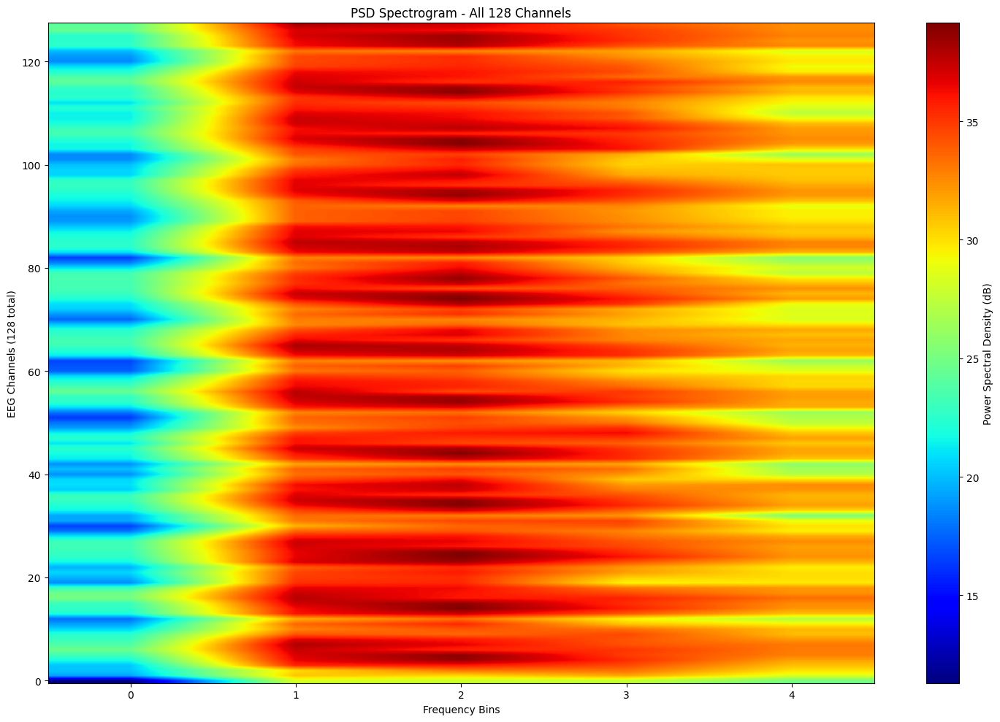

In [18]:
from scipy import signal

def compute_psd_spectrogram(entry, nperseg=8, noverlap=4):
    """
    Compute Power Spectral Density based spectrogram for better frequency representation.
    """
    eeg_data = entry['eeg']  # shape: (time_samples, 128)

    # Compute PSD for each channel
    psd_results = []
    for channel in range(128):
        f, t, Sxx = signal.spectrogram(eeg_data[:, channel],
                                     nperseg=nperseg,
                                     noverlap=noverlap,
                                     scaling='density')
        psd_results.append(Sxx)

    # Stack results: shape (128, freq_bins, time_bins)
    psd_spectrogram = np.stack(psd_results)
    entry['psd_spectrogram'] = psd_spectrogram
    entry['psd_frequencies'] = f
    entry['psd_times'] = t

def plot_psd_spectrogram(entry, figsize=(15, 10)):
    """
    Plot PSD-based spectrogram.
    """
    psd_data = entry['psd_spectrogram']  # shape: (128, freq_bins, time_bins)

    # Average across time for visualization
    psd_avg = np.mean(psd_data, axis=2)  # shape: (128, freq_bins)

    # Apply logarithmic scaling
    log_psd = 10 * np.log10(psd_avg + 1e-12)

    plt.figure(figsize=figsize)
    im = plt.imshow(log_psd, aspect='auto', origin='lower',
                    cmap='jet', interpolation='bilinear')

    plt.colorbar(im, label='Power Spectral Density (dB)')
    plt.xlabel('Frequency Bins')
    plt.ylabel('EEG Channels (128 total)')
    plt.title('PSD Spectrogram - All 128 Channels')

    plt.tight_layout()
    plt.show()

# Apply PSD computation and plotting
compute_psd_spectrogram(preprocessed_data[0])
plot_psd_spectrogram(preprocessed_data[0])
